In [1]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
print("GPUs available:", physical_devices)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
from functools import partial
import math
import numpy as np

from ocml.datasets import load_toy_2d, default_process, build_ds_from_numpy, tfds_from_sampler
from ocml.evaluate import check_LLC, log_metrics
from ocml.models import conventional_dense, spectral_dense
from ocml.plot import plot_2D_contour
from ocml.priors import uniform_tabular
from ocml.train import train, SH_KR, BCE

In [3]:
from types import SimpleNamespace

def get_config(debug=False):
  config = SimpleNamespace(
    num_pts = 4000,
    dataset_name = "two-circles",
    optimizer = 'rmsprop',  # optimizer; good default value.
    batch_size = 256,  # should be not too small to ensure diversity.
    domain = [-5, 5.],  # domain on which to sample points.
    maxiter = 4,  # very important on high dimensional dataset.
    margin = 0.05,  # very important !
    lbda = 100.,  # important but not as much as `margin`. Must be high for best results.
    k_coef_lip = 1.,  # no reason to change this.
    noise = 0.05,  # to introduce noise in dataset (for better plots)
    spectral_dense = True,  # Mandatory for orthogonal networks. 
    deterministic = False,  # Better with random learning rates.
    conventional = False,  # Conventional training (i.e without hKR and Lipschitz constraint) for sanity check.
    widths = [512, 512, 512, 512],
    warmup_epochs=5,
    epochs_per_plot=5,
    epoch_length = 1000
  )
  return config

In [4]:
debug = False
config = get_config(debug)
train_kwargs = {
  'domain': config.domain,
  'deterministic': config.deterministic,
  'overshoot_boundary': True
}

In [5]:
try:
  import os
  os.environ['WANDB_NOTEBOOK_NAME'] = 'run_toy2d.ipynb'
  import wandb
  wandb.login()
  wandb_available = True
except ModuleNotFoundError as e:
  print(e)
  print("Wandb logs will be removed.")
  wandb_available = False
plot_wandb = wandb_available and not debug  # Set to False to de-activate Wandb.
if plot_wandb:  
  import wandb
  wandb.init(project="ocml_toy2d", config=config.__dict__)
else:
  try:
    wandb.finish()
  except Exception as e:
    print(e)
    
train_kwargs['log_metrics_fn'] = partial(log_metrics, plot_wandb=plot_wandb)

wandb: Currently logged in as: algue (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.13.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [6]:
# Train model.
if config.conventional:
  model = conventional_dense(widths=config.widths, input_shape=(2,))
else:
  model = spectral_dense(widths=config.widths, input_shape=(2,),
                         k_coef_lip=config.k_coef_lip)

if config.conventional:
  loss_fn = BCE()
else:
  loss_fn = SH_KR(config.margin, config.lbda)

In [7]:
# Produce and process dataset.
X, y = load_toy_2d(config.dataset_name, config.num_pts, config.noise)
X, y = default_process(X, y)
p_dataset = build_ds_from_numpy(X, config.batch_size)

In [8]:
# Create optimizer.
opt =  tf.keras.optimizers.get(config.optimizer)

# Initialize the network.
gen = tf.random.Generator.from_seed(4321)  # reproducible sampling.
p_batch = next(iter(p_dataset))
_ = model(p_batch, training=True)  # dummy forward to trigger initialization.
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spectral_dense (SpectralDens (None, 512)               3073      
_________________________________________________________________
full_sort (FullSort)         (None, 512)               0         
_________________________________________________________________
spectral_dense_1 (SpectralDe (None, 512)               525313    
_________________________________________________________________
full_sort_1 (FullSort)       (None, 512)               0         
_________________________________________________________________
spectral_dense_2 (SpectralDe (None, 512)               525313    
_________________________________________________________________
full_sort_2 (FullSort)       (None, 512)               0         
_________________________________________________________________
spectral_dense_3 (SpectralDe (None, 512)               5

In [9]:
# Adversarial distribution.
q_dataset = tfds_from_sampler(uniform_tabular, gen, config.batch_size, p_batch.shape[1:], domain=config.domain)
Q0 = next(iter(q_dataset))

S=0.9999999403953552 2-inf=[('0.002216679509729147', '0.16158440709114075')] inf=[('0.0022651967592537403', '0.22833845019340515')] 2=[(0.99999994, 0.99999994)]
S=1.0000008344650269 2-inf=[('0.9999998807907104', '1.0000001192092896')] inf=[('17.382505416870117', '18.577247619628906')] 2=[(0.9999992, 1.0000008)]
S=1.0000008344650269 2-inf=[('0.9999998807907104', '1.0000001192092896')] inf=[('17.29793357849121', '18.69744873046875')] 2=[(0.9999993, 1.0000008)]
S=1.0000008344650269 2-inf=[('0.9999998807907104', '1.000000238418579')] inf=[('17.215404510498047', '18.647438049316406')] 2=[(0.9999993, 1.0000008)]
Example n°158 from train set has norm 0.14496208727359772.
max_i \|nabla_x f(x_i)\|: tf.Tensor([[0.14496206]], shape=(1, 1), dtype=float32)
LLC = Local Lipschitz Constant
Input, LLC wrt Input, LLC wrt previous layer
Input_Norms 0.0014495913919506972 0.0014495913919506972
0 <class 'deel.lip.layers.SpectralDense'> 1.00 1.00
1 <class 'deel.lip.activations.FullSort'> 0.98 0.98
2 <class '

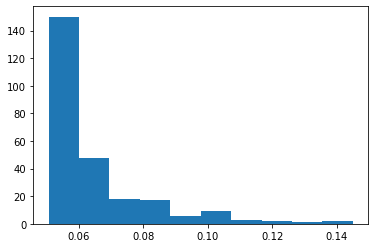

In [10]:
check_LLC(model, Q0, plot_wandb)

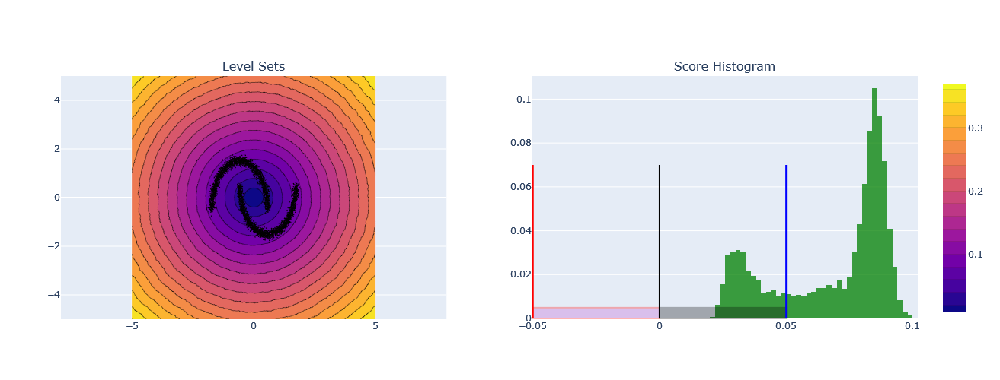

In [11]:
plot_2D_contour(model, loss_fn, X, config.domain, height=0.07, plot_wandb=plot_wandb)

100%|██████████| 1000/1000 [01:12<00:00, 13.86it/s, FP=0.05%, GN_Qt=0.000, P=0.092, Q0=-1.591, Qt=-1.591, R=1.00%, lipschitz_ratio=1.000, loss=-0.008]


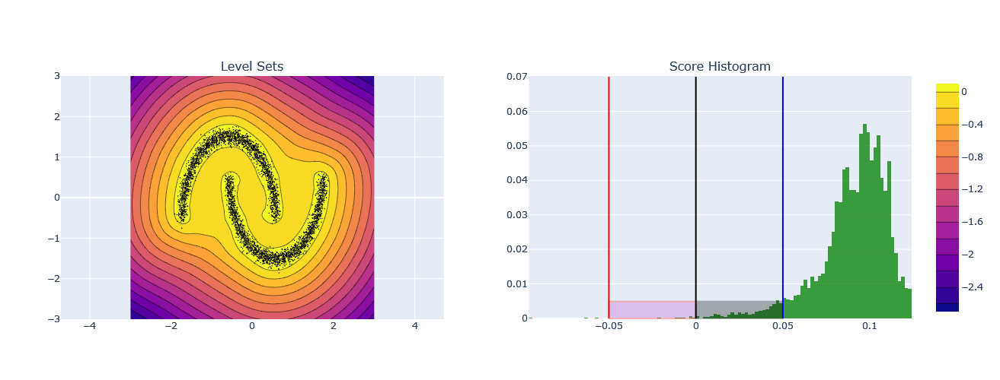

In [12]:
num_epochs = config.warmup_epochs
for epoch in range(num_epochs):
  train(model, opt, loss_fn, gen, p_dataset, q_dataset, config.epoch_length, maxiter=0, **train_kwargs)
plot_2D_contour(model, loss_fn, X, [-3., 3.], height=0.07, plot_wandb=plot_wandb)

In [ ]:
for epoch in range(config.epochs_per_plot):
  train(model, opt, loss_fn, gen, p_dataset, q_dataset, config.epoch_length, maxiter=config.maxiter, **train_kwargs)
plot_2D_contour(model, loss_fn, X, [-3., 3.], height=0.07, plot_wandb=plot_wandb)

 34%|███▎      | 337/1000 [00:27<00:53, 12.43it/s, FP=0.05%, GN_Qt=0.909, P=0.084, Q0=-1.461, Qt=-0.870, R=1.00%, lipschitz_ratio=0.592, loss=-0.001]

In [ ]:
for epoch in range(config.epochs_per_plot):
  train(model, opt, loss_fn, gen, p_dataset, q_dataset, config.epoch_length, maxiter=config.maxiter, **train_kwargs)
plot_2D_contour(model, loss_fn, X, [-3., 3.], height=0.07, plot_wandb=plot_wandb)

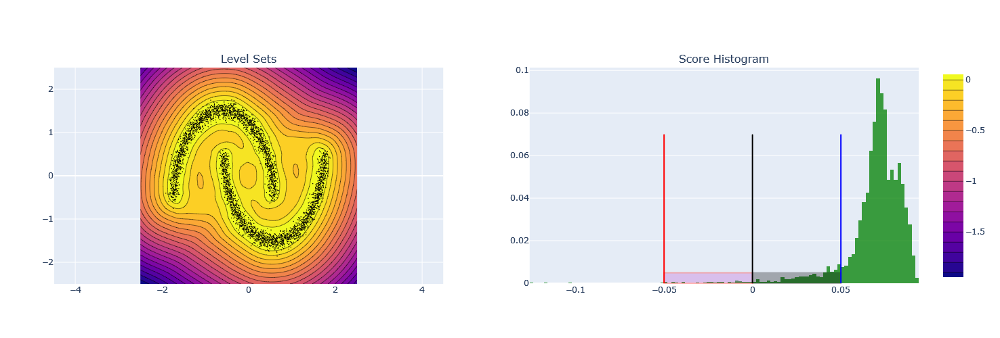

In [18]:
plot_2D_contour(model, loss_fn, X, [-2.5, 2.5], height=0.07, plot_wandb=plot_wandb, ncontours=40)